## 클래스 합침

In [1]:
import pandas as pd
import numpy as np
import sklearn
import seaborn
import matplotlib.pyplot as plt

In [2]:
wash_data = pd.read_csv('./wash.csv', header=None)
brush_data = pd.read_csv('./brush.csv', header=None)
eat_data = pd.read_csv('./eat.csv', header=None)
dummy_data = pd.read_csv('./dummy.csv', header=None)
sit_stand_data = pd.read_csv('./sit_stand.csv', header=None)
walk_data = pd.read_csv('./walk.csv', header=None)
siso_data = pd.read_csv('./siso.csv', header=None)
swing_data = pd.read_csv('./swing.csv', header=None)

In [5]:
dummy_data[25] = 0
sit_stand_data[25] = 1
walk_data[25] = 2
wash_data[25] = 3
brush_data[25] = 4
eat_data[25] = 5
swing_data[25] = 6
siso_data[25] = 7

dummy_arr = dummy_data.to_numpy()
sit_stand_arr = sit_stand_data.to_numpy()
walk_arr = walk_data.to_numpy()
wash_arr = wash_data.to_numpy()
brush_arr = brush_data.to_numpy()
eat_arr = eat_data.to_numpy()
siso_arr = siso_data.to_numpy()
swing_arr = swing_data.to_numpy()

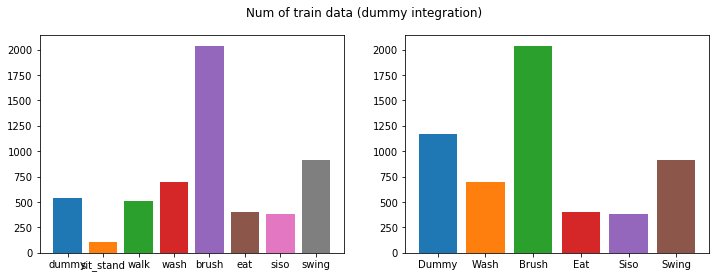

In [6]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.bar(0, len(dummy_arr))
plt.bar(1, len(sit_stand_arr))
plt.bar(2, len(walk_arr))
plt.bar(3, len(wash_arr))
plt.bar(4, len(brush_arr))
plt.bar(5, len(eat_arr))
plt.bar(6, len(siso_arr))
plt.bar(7, len(swing_arr))

plt.xticks((0, 1, 2, 3, 4, 5, 6, 7), ('dummy', 'sit_stand', 'walk', 'wash', 'brush', 'eat', 'siso', 'swing'))
plt.suptitle('Num of train data')


plt.subplot(1, 2, 2)
plt.bar(0, len(dummy_arr) + len(sit_stand_arr) + len(walk_arr))
plt.bar(1, len(wash_arr))
plt.bar(2, len(brush_arr))
plt.bar(3, len(eat_arr))
plt.bar(4, len(siso_arr))
plt.bar(5, len(swing_arr))

plt.xticks((0, 1, 2, 3, 4, 5), ('Dummy', 'Wash', 'Brush', 'Eat', 'Siso', 'Swing'))
plt.suptitle('Num of train data (dummy integration)')

plt.show() 

In [7]:
# 16
sit_stand_data[25] = 0 # dummy label
walk_data[25] = 0 # dummy label
dummy_arr = np.concatenate((dummy_arr, sit_stand_data.to_numpy(), walk_data.to_numpy()))

In [8]:
# drop data
brush_arr = sklearn.utils.resample(brush_arr, n_samples = 500, random_state = 42) # wash sampled 500 
# sampled_dummy = dummy_arr
# sampled_wash = sklearn.utils.resample(wash_arr, n_samples = 500, random_state = 42) # wash sampled 500 
# sampled_brush = sklearn.utils.resample(brush_arr, n_samples = 500, random_state = 42) # wash sampled 500 
# sampled_eat = sklearn.utils.resample(eat_arr, n_samples = 500, random_state = 42) # wash sampled 500 

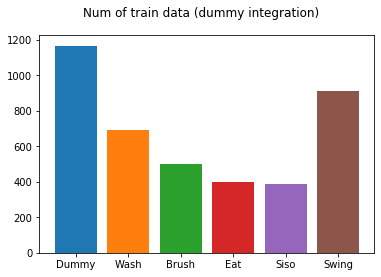

In [12]:
import matplotlib.pyplot as plt

plt.bar(0, len(dummy_arr))
plt.bar(1, len(wash_arr))
plt.bar(2, len(brush_arr))
plt.bar(3, len(eat_arr))
plt.bar(4, len(siso_arr))
plt.bar(5, len(swing_arr))

plt.xticks((0, 1, 2, 3, 4, 5), ('Dummy', 'Wash', 'Brush', 'Eat', 'Siso', 'Swing'))
plt.suptitle('Num of train data (dummy integration)')

plt.show() 

In [13]:
tot_data = np.concatenate((dummy_arr, wash_arr, brush_arr, eat_arr, siso_arr, swing_arr))
train_x = tot_data[:,:-1]
train_y = tot_data[:,-1:]

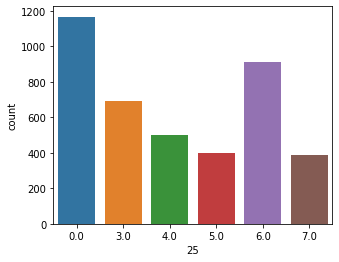

In [15]:
import seaborn as sns
plt.figure(figsize=(5, 4))
df = pd.DataFrame(tot_data)
sns.countplot(x = 25, data = df)

# visualization

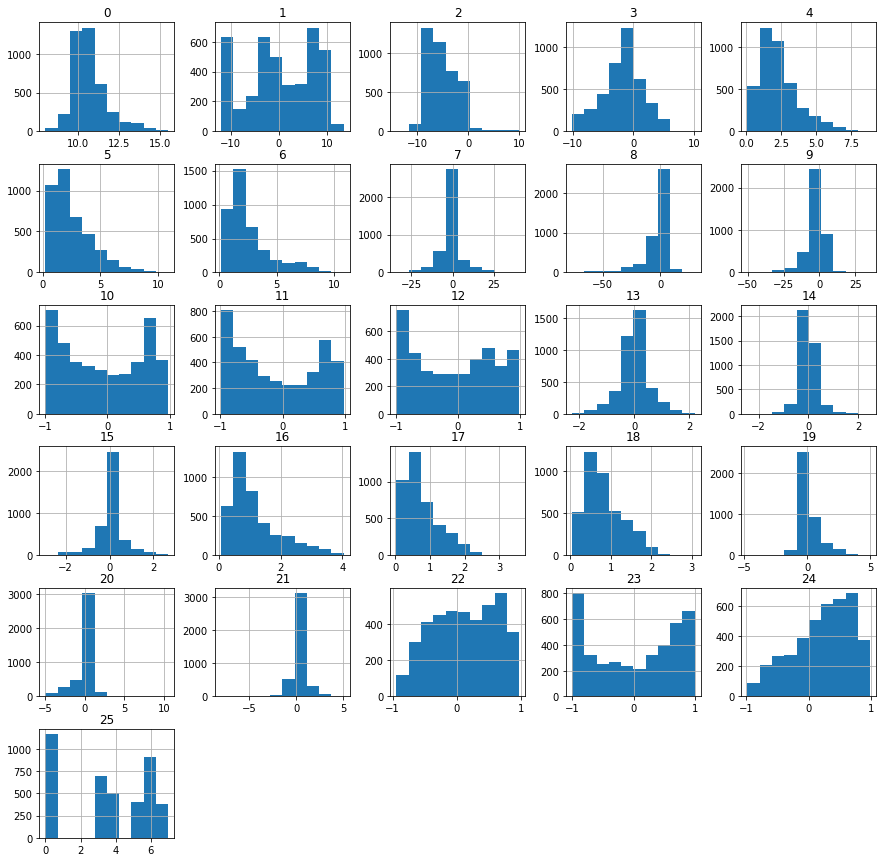

In [16]:
df[df.columns].hist(figsize=(15, 15))
plt.show()

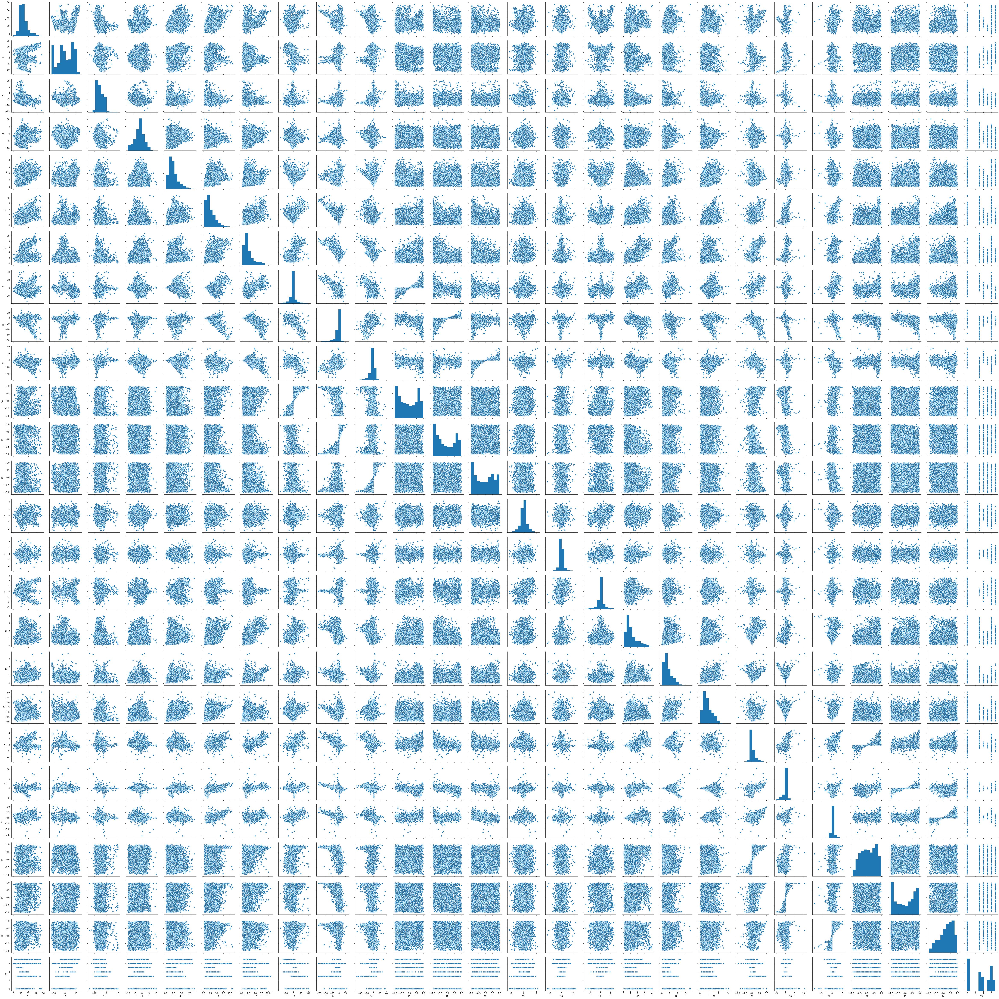

In [17]:
sns.pairplot(df)

# train

In [21]:
# 10 - fold cross validation accruracy

from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
svm_clf_ = SVC(random_state=42, gamma = 0.01, C = 100)
scores = cross_val_score(svm_clf_, train_x, train_y.flatten(), cv=skf)


def printScore(scores):
    print("scores: ")
    for i in scores:
        print(i)
    print("\n")
    print(f"average: {round(np.mean(scores), 2)}")
    
printScore(scores)

scores: 
0.8333333333333334
0.8284313725490197
0.8255528255528255
0.8452088452088452
0.8054187192118226
0.8024691358024691
0.8197530864197531
0.8292079207920792
0.849009900990099
0.8287841191066998


average: 0.83


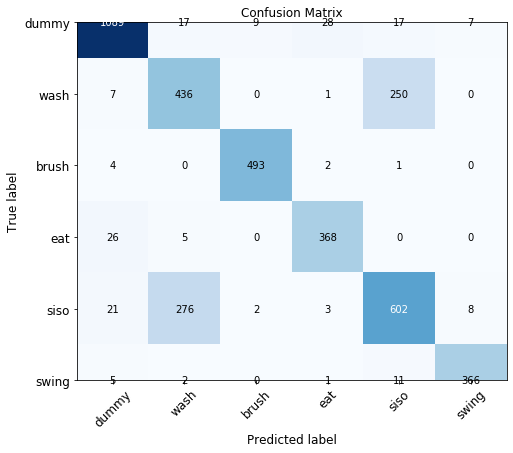

In [27]:
# 10 fold cross validation confusion matrix

from sklearn.model_selection import cross_val_predict
svm_clf = SVC(random_state=42, gamma = 0.01, C = 100)
y_train_pred = cross_val_predict(svm_clf, train_x, train_y.flatten(), cv=skf)

class_names = ['dummy', 'wash', 'brush', 'eat', 'siso', 'swing']


from sklearn.metrics import confusion_matrix

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.figure(figsize=(5, 5))
mpl.rc('axes', labelsize=12)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Compute confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(train_y.flatten(), y_train_pred)


plt.imshow(cm, interpolation='nearest', cmap='Blues')
plt.title("Confusion Matrix")
plt.xticks(np.arange(len(class_names)), class_names, rotation=45)
plt.yticks(np.arange(len(class_names)), class_names)

thresh = cm.max() / 2.
for (i, j), z in np.ndenumerate(cm):
    plt.text(j, i, z, ha='center', va='center', color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')

plt.show()

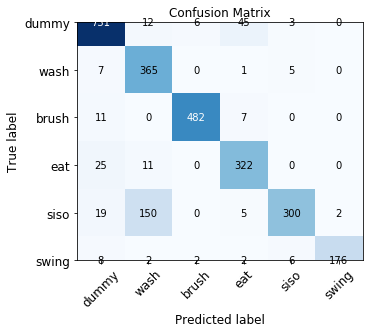

In [50]:
# 10 fold cross validation confusion matrix

from sklearn.model_selection import cross_val_predict
svm_clf = SVC(random_state=42, gamma = 0.01, C = 1)
y_train_pred = cross_val_predict(svm_clf, train_x, train_y.flatten(), cv=skf)

class_names = ['dummy', 'wash', 'brush', 'eat', 'siso', 'swing']


from sklearn.metrics import confusion_matrix

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.figure(figsize=(5, 5))
mpl.rc('axes', labelsize=12)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Compute confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(train_y.flatten(), y_train_pred)


plt.imshow(cm, interpolation='nearest', cmap='Blues')
plt.title("Confusion Matrix")
plt.xticks(np.arange(len(class_names)), class_names, rotation=45)
plt.yticks(np.arange(len(class_names)), class_names)

thresh = cm.max() / 2.
for (i, j), z in np.ndenumerate(cm):
    plt.text(j, i, z, ha='center', va='center', color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')

plt.show()

window_size = 40 # 1, 2 sec
feature 16 -> 25

In [23]:
# classification report

from sklearn.metrics import classification_report
print(classification_report(train_y.flatten(), y_train_pred, target_names = class_names))

              precision    recall  f1-score   support

       dummy       0.95      0.93      0.94      1167
        wash       0.59      0.63      0.61       694
       brush       0.98      0.99      0.98       500
         eat       0.91      0.92      0.92       399
        siso       0.68      0.66      0.67       912
       swing       0.96      0.95      0.96       385

    accuracy                           0.83      4057
   macro avg       0.85      0.85      0.85      4057
weighted avg       0.83      0.83      0.83      4057



# window size = 40

In [34]:
wash_data = pd.read_csv('./long/wash.csv', header=None)
brush_data = pd.read_csv('./long/brush.csv', header=None)
eat_data = pd.read_csv('./long/eat.csv', header=None)
dummy_data = pd.read_csv('./long/dummy.csv', header=None)
sit_stand_data = pd.read_csv('./long/sit_stand.csv', header=None)
walk_data = pd.read_csv('./long/walk.csv', header=None)
siso_data = pd.read_csv('./long/siso.csv', header=None)
swing_data = pd.read_csv('./long/swing.csv', header=None)

In [35]:
dummy_data[25] = 0
sit_stand_data[25] = 1
walk_data[25] = 2
wash_data[25] = 3
brush_data[25] = 4
eat_data[25] = 5
swing_data[25] = 6
siso_data[25] = 7

dummy_arr = dummy_data.to_numpy()
sit_stand_arr = sit_stand_data.to_numpy()
walk_arr = walk_data.to_numpy()
wash_arr = wash_data.to_numpy()
brush_arr = brush_data.to_numpy()
eat_arr = eat_data.to_numpy()
siso_arr = siso_data.to_numpy()
swing_arr = swing_data.to_numpy()

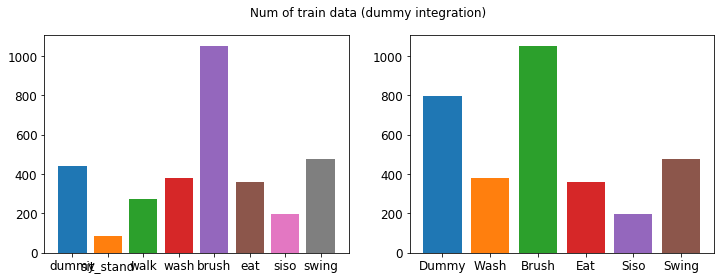

In [36]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.bar(0, len(dummy_arr))
plt.bar(1, len(sit_stand_arr))
plt.bar(2, len(walk_arr))
plt.bar(3, len(wash_arr))
plt.bar(4, len(brush_arr))
plt.bar(5, len(eat_arr))
plt.bar(6, len(siso_arr))
plt.bar(7, len(swing_arr))

plt.xticks((0, 1, 2, 3, 4, 5, 6, 7), ('dummy', 'sit_stand', 'walk', 'wash', 'brush', 'eat', 'siso', 'swing'))
plt.suptitle('Num of train data')


plt.subplot(1, 2, 2)
plt.bar(0, len(dummy_arr) + len(sit_stand_arr) + len(walk_arr))
plt.bar(1, len(wash_arr))
plt.bar(2, len(brush_arr))
plt.bar(3, len(eat_arr))
plt.bar(4, len(siso_arr))
plt.bar(5, len(swing_arr))

plt.xticks((0, 1, 2, 3, 4, 5), ('Dummy', 'Wash', 'Brush', 'Eat', 'Siso', 'Swing'))
plt.suptitle('Num of train data (dummy integration)')

plt.show() 

In [37]:
sit_stand_data[25] = 0 # dummy label
walk_data[25] = 0 # dummy label
dummy_arr = np.concatenate((dummy_arr, sit_stand_data.to_numpy(), walk_data.to_numpy()))

In [38]:
# drop data
brush_arr = sklearn.utils.resample(brush_arr, n_samples = 500, random_state = 42) # wash sampled 500 
# sampled_dummy = dummy_arr
# sampled_wash = sklearn.utils.resample(wash_arr, n_samples = 500, random_state = 42) # wash sampled 500 
# sampled_brush = sklearn.utils.resample(brush_arr, n_samples = 500, random_state = 42) # wash sampled 500 
# sampled_eat = sklearn.utils.resample(eat_arr, n_samples = 500, random_state = 42) # wash sampled 500 

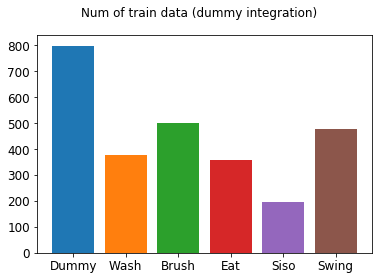

In [39]:
import matplotlib.pyplot as plt

plt.bar(0, len(dummy_arr))
plt.bar(1, len(wash_arr))
plt.bar(2, len(brush_arr))
plt.bar(3, len(eat_arr))
plt.bar(4, len(siso_arr))
plt.bar(5, len(swing_arr))

plt.xticks((0, 1, 2, 3, 4, 5), ('Dummy', 'Wash', 'Brush', 'Eat', 'Siso', 'Swing'))
plt.suptitle('Num of train data (dummy integration)')

plt.show() 

In [40]:
tot_data = np.concatenate((dummy_arr, wash_arr, brush_arr, eat_arr, siso_arr, swing_arr))
train_x = tot_data[:,:-1]
train_y = tot_data[:,-1:]

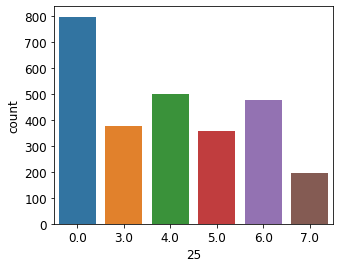

In [41]:
import seaborn as sns
plt.figure(figsize=(5, 4))
df = pd.DataFrame(tot_data)
sns.countplot(x = 25, data = df)

In [42]:
# 10 - fold cross validation accruracy

from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
svm_clf_ = SVC(random_state=42, gamma = 0.01, C = 100)
scores = cross_val_score(svm_clf_, train_x, train_y.flatten(), cv=skf)


def printScore(scores):
    print("scores: ")
    for i in scores:
        print(i)
    print("\n")
    print(f"average: {round(np.mean(scores), 2)}")
    
printScore(scores)

scores: 
0.8382352941176471
0.8860294117647058
0.8235294117647058
0.8455882352941176
0.875
0.8713235294117647
0.8407407407407408
0.8401486988847584
0.8614232209737828
0.8314606741573034


average: 0.85


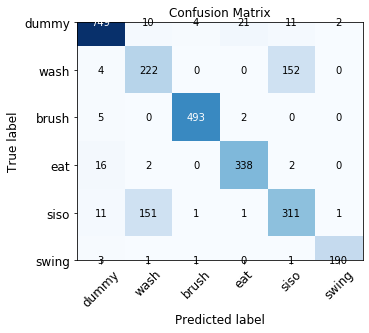

In [43]:
# 10 fold cross validation confusion matrix

from sklearn.model_selection import cross_val_predict
svm_clf = SVC(random_state=42, gamma = 0.01, C = 100)
y_train_pred = cross_val_predict(svm_clf, train_x, train_y.flatten(), cv=skf)

class_names = ['dummy', 'wash', 'brush', 'eat', 'siso', 'swing']


from sklearn.metrics import confusion_matrix

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.figure(figsize=(5, 5))
mpl.rc('axes', labelsize=12)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Compute confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(train_y.flatten(), y_train_pred)


plt.imshow(cm, interpolation='nearest', cmap='Blues')
plt.title("Confusion Matrix")
plt.xticks(np.arange(len(class_names)), class_names, rotation=45)
plt.yticks(np.arange(len(class_names)), class_names)

thresh = cm.max() / 2.
for (i, j), z in np.ndenumerate(cm):
    plt.text(j, i, z, ha='center', va='center', color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')

plt.show()

In [44]:
# classification report

from sklearn.metrics import classification_report
print(classification_report(train_y.flatten(), y_train_pred, target_names = class_names))

              precision    recall  f1-score   support

       dummy       0.95      0.94      0.95       797
        wash       0.58      0.59      0.58       378
       brush       0.99      0.99      0.99       500
         eat       0.93      0.94      0.94       358
        siso       0.65      0.65      0.65       476
       swing       0.98      0.97      0.98       196

    accuracy                           0.85      2705
   macro avg       0.85      0.85      0.85      2705
weighted avg       0.85      0.85      0.85      2705

